# County level US Data

Provided by:  https://usafacts.org/visualizations/coronavirus-covid-19-spread-map/ 
        

In [169]:
# import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

confirmed_f = 'USAfacts/usa-confirmed.csv'
deaths_f = 'USAfacts/usa-deaths.csv'

dfc = pd.read_csv(confirmed_f)
dfd = pd.read_csv(deaths_f)

dfc['count'] = dfc.iloc[:,-1]
dfd['count'] = dfd.iloc[:,-1]

display(dfc[['countyFIPS','County Name', 'State','stateFIPS','3/19/2020','count']].head())
display(dfd[['countyFIP','County Name', 'State','stateFIPS','3/19/2020','count']].head())



,countyFIPS,County Name,State,stateFIPS,3/19/2020,count
0,0,Statewide Unallocated,AL,1,0,0
1,1003,Baldwin County,AL,1,1,1
2,1015,Calhoun County,AL,1,1,1
3,1017,Chambers County,AL,1,1,1
4,1051,Elmore County,AL,1,5,5


,countyFIP,County Name,State,stateFIPS,3/19/2020,count
0,0,Statewide Unallocated,AL,1,0,0
1,1003,Baldwin County,AL,1,0,0
2,1015,Calhoun County,AL,1,0,0
3,1017,Chambers County,AL,1,0,0
4,1051,Elmore County,AL,1,0,0


In [170]:
# join data (assume keys are stable between both files, otherwise join on named key)

display(dfd[dfd['count'] > 0 ][66:69])
dfc['deathcount'] = dfd['count']
dfc[66:69]

,countyFIP,County Name,State,stateFIPS,1/22/2020,1/23/2020,1/24/2020,1/25/2020,1/26/2020,1/27/2020,...,3/11/2020,3/12/2020,3/13/2020,3/14/2020,3/15/2020,3/16/2020,3/17/2020,3/18/2020,3/19/2020,count
732,51095,James City County,VA,51,0,0,0,0,0,0,...,0,0,0,1,1,1,1,1,1,1
738,51199,York County,VA,51,0,0,0,0,0,0,...,0,0,0,0,0,1,1,1,1,1
748,53005,Benton County,WA,53,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1


,countyFIPS,County Name,State,stateFIPS,1/22/2020,1/23/2020,1/24/2020,1/25/2020,1/26/2020,1/27/2020,...,3/12/2020,3/13/2020,3/14/2020,3/15/2020,3/16/2020,3/17/2020,3/18/2020,3/19/2020,count,deathcount
66,6061,Placer County,CA,6,0,0,0,0,0,0,...,7,7,8,8,8,8,9,9,9,1
67,6065,Riverside County,CA,6,0,0,0,0,0,0,...,8,8,8,14,15,16,16,22,22,3
68,6067,Sacramento County,CA,6,0,0,0,0,0,0,...,10,17,29,32,33,40,40,45,45,3


In [171]:
# sum by state

dfc.groupby( ['State']).sum().loc[['NY','CA','NC','NJ'],['count','deathcount']]

,count,deathcount
State,,
NY,5637,36
CA,1066,19
NC,137,0
NJ,742,9


## Using PyPlot GeoJSON and ChoroPleth maps

https://plot.ly/python/choropleth-maps/

Install
- pyplot
- pyplot-orca


In [172]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

import pandas as pd
df = dfc[['countyFIPS','count','County Name','State','deathcount']].copy()
df['County, ST'] = df['County Name']+', '+df['State']
display(df.shape)

# make FIPS 5 char to match geojson data
df['countyFIPSstr'] = df['countyFIPS'].apply(lambda x: str(x) if x > 9999 else '0'+str(x)) 
df.head()


(805, 6)

,countyFIPS,count,County Name,State,deathcount,"County, ST",countyFIPSstr
0,0,0,Statewide Unallocated,AL,0,"Statewide Unallocated, AL",00
1,1003,1,Baldwin County,AL,0,"Baldwin County, AL",01003
2,1015,1,Calhoun County,AL,0,"Calhoun County, AL",01015
3,1017,1,Chambers County,AL,0,"Chambers County, AL",01017
4,1051,5,Elmore County,AL,0,"Elmore County, AL",01051


In [173]:
import plotly.express as px

fig = px.choropleth(df, geojson=counties, 
                           locations='countyFIPSstr', 
                           color='count',
                           color_continuous_scale="OrRd",
                           range_color=(0,200),
                           scope="usa",
                           hover_name='County, ST',
                           labels={'covis':'covis count'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


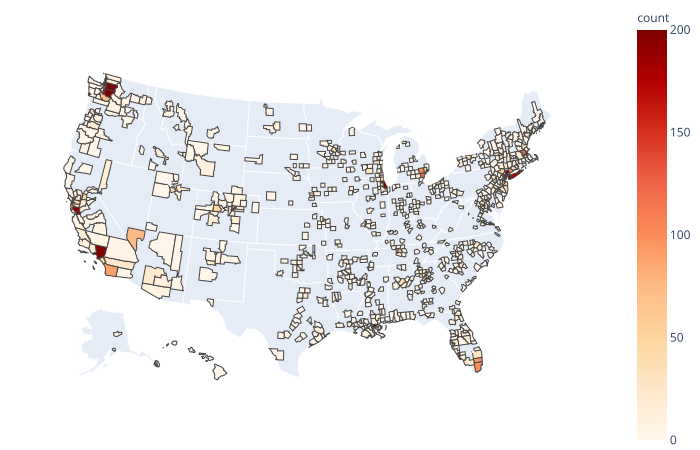

In [174]:

fig.show("svg")


In [194]:
#first 5 digits are fips state+county
cgeo_df = pd.read_csv('maps/safegraph_open_census_data/metadata/cbg_geographic_data.csv', dtype=str)
cgeo_df['countryFIPSstr'] = cgeo_df['census_block_group'].apply(lambda x: str(x)[0:5])
cgeo_df = cgeo_df.astype({'longitude': 'float','latitude': 'float'})

#spot check
display(cgeo_df)


cgeo_df = cgeo_df.groupby('countryFIPSstr').agg({'latitude':'max', 'longitude':'max'})

display(cgeo_df.head())
display(df.head())

# remove 00 unmappep/allocated for now
df = df[df['countyFIPSstr'] != '00']

print('dup check')
display(df.groupby('countyFIPSstr').filter(lambda x: len(x) > 1))

print('join to df2')
df2 = df.join(cgeo_df, on='countyFIPSstr')

df2.head()


census_block_group     object
amount_land            object
amount_water           object
latitude              float64
longitude             float64
countryFIPSstr         object
dtype: object

,census_block_group,amount_land,amount_water,latitude,longitude,countryFIPSstr
0,010010201001,4254524,23431,32.465829,-86.489614,01001
1,010010201002,5568295,0,32.485849,-86.489690,01001
2,010010202001,2058380,0,32.480082,-86.474974,01001
3,010010202002,1283506,5968,32.464435,-86.469766,01001
4,010010203001,3866515,9054,32.480175,-86.460792,01001
...,...,...,...,...,...,...
220328,721537506011,7628406,4527,18.016817,-66.832048,72153
220329,721537506012,1569471,0,18.016458,-66.848976,72153
220330,721537506013,1789160,0,18.019857,-66.856470,72153
220331,721537506021,1136089,1997,18.010528,-66.866798,72153


,latitude,longitude
countryFIPSstr,,
01001,32.683609,-86.418657
01003,31.168548,-87.439191
01005,32.068959,-85.113641
01007,33.214580,-86.932756
01009,34.216206,-86.361561


,countyFIPS,count,County Name,State,deathcount,"County, ST",countyFIPSstr
1,1003,1,Baldwin County,AL,0,"Baldwin County, AL",01003
2,1015,1,Calhoun County,AL,0,"Calhoun County, AL",01015
3,1017,1,Chambers County,AL,0,"Chambers County, AL",01017
4,1051,5,Elmore County,AL,0,"Elmore County, AL",01051
5,1073,34,Jefferson County,AL,0,"Jefferson County, AL",01073


dup check


,countyFIPS,count,County Name,State,deathcount,"County, ST",countyFIPSstr


join to df2


,countyFIPS,count,County Name,State,deathcount,"County, ST",countyFIPSstr,latitude,longitude
1,1003,1,Baldwin County,AL,0,"Baldwin County, AL",01003,31.168548,-87.439191
2,1015,1,Calhoun County,AL,0,"Calhoun County, AL",01015,33.947218,-85.569262
3,1017,1,Chambers County,AL,0,"Chambers County, AL",01017,33.045373,-85.149241
4,1051,5,Elmore County,AL,0,"Elmore County, AL",01051,32.739637,-85.903935
5,1073,34,Jefferson County,AL,0,"Jefferson County, AL",01073,33.824826,-86.529652


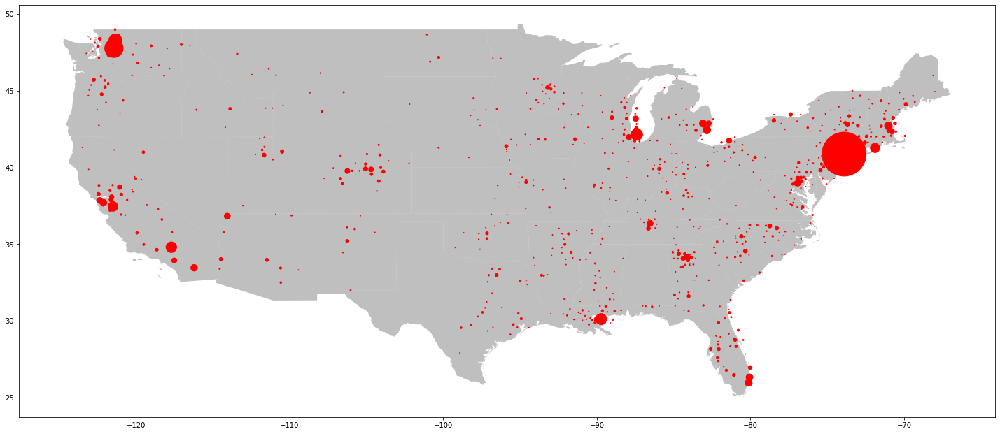

In [213]:
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline

usa = gpd.read_file('maps/states.shp')

# remove hi/ak for now
df2 = df2[~df2['State'].isin(['HI','AK'])]
cusa = usa[~usa['STATE_NAME'].isin(['Hawaii','Alaska'])]

geometry = [Point(xy) for xy in zip(df2["longitude"],df2["latitude"]) ] 
geo_df = gpd.GeoDataFrame(df2,crs={"init": "epsg:4326"},geometry=geometry)
geo_df = geo_df[['County Name','count','geometry']]

# display(usa[0:3])
# display(geo_df)

fig, ax = plt.subplots(figsize=(25,25))

cusa.plot(ax=ax, alpha=0.5, color='grey')

#geo_df.plot(ax=ax, markersize=10, cmap='Reds', label='case')
geo_df.plot(ax=ax, markersize=df2['count'], color='red', label='case')
